## Paths

In [1]:
cloud_GPU = False

if (cloud_GPU):
    root_dir = r"/workspace/datasets/My_Imagenet"
    sd_root = r"/workspace/Brain2Clip_Diffusion_GPU"
    
else:
    root_dir = r"D:\For Thesis Project\Datasets\My_ImageNet"
    sd_root = r"C:\Users\bruno\OneDrive\Desktop\BrainReader RESEARCH\Code\external_gits\StableDiffusion_img2img\stable-diffusion"

## Imports

In [2]:
import os
import sys

folder_path = r"C:\Users\bruno\OneDrive\Desktop\BrainReader RESEARCH\Brain2Clip_Diffusion_GPU"
# Check if folder_path exists
if os.path.exists(folder_path):
    # Add folder_path to PYTHONPATH
    sys.path.insert(0, folder_path)
else:
    print(f"Error: Folder path {folder_path} does not exist")

In [3]:
from io import BytesIO
import os
from contextlib import nullcontext
import glob

import fire
import numpy as np
import torch
from einops import rearrange
from omegaconf import OmegaConf
from PIL import Image
from torch import autocast
from torchvision import transforms
import requests
import pandas as pd

from ldm.models.diffusion.ddim import DDIMSampler
from ldm.models.diffusion.plms import PLMSSampler
from ldm.util import instantiate_from_config

In [4]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import math
import numpy as np
from skimage import io
import torchvision.transforms as T
from typing import List, Optional, Union

from scipy.signal import savgol_filter
from six.moves import xrange
import umap
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torch.optim as optim
from torch.utils.data import Dataset

import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.utils import make_grid

from ipynb.fs.full.WaveSeparatorCode import *

install cvxpy for L1 norm minimization for PeriodStrength fun (Ramanujan methods)


In [5]:
from sklearn.linear_model import Ridge
import pickle
import nibabel as nib
import pandas as pd
import nilearn as nil

In [6]:
from nilearn.decomposition import DictLearning
from nilearn import plotting
from nilearn.maskers import NiftiLabelsMasker

## Load Hyper

In [7]:

def load_hyper(subject, run, root = r"D:\Datasets\HYPER_face_fmri"):
    
    path = os.path.join(root, f"sub-0{subject}\\func")
    
    bold_path = os.path.join(path, rf"sub-0{subject}_task-hyper_run-0{run}_bold.nii")
    task_path = os.path.join(path, f"sub-0{subject}_task-hyper_run-0{run}_events.tsv")

    # Load the fMRI BOLD.nii file
    proxy_bold = nib.load(bold_path)
   
    print("shape", proxy_bold.shape)

    bbox = (slice(None), slice(None), slice(None), slice(5))

    
    # Get the BOLD data as a 4D numpy array (x,y,z,time)
    bold_data = proxy_bold.dataobj[:,:,:,0:100]
    # Load the events.tsv file as a pandas dataframe
    events_df = pd.read_csv(task_path, sep='\t')

    # Print the dimensions of the BOLD data and the number of events
    print(f'BOLD data shape: {bold_data.shape}')
    print(f'Number of events: {len(events_df)}')
    return bold_data, events_df

In [17]:
bold, events = load_hyper(1,1)
#D:\Datasets\HYPER_face_fmri\ds004280

shape (104, 104, 66, 1461)
BOLD data shape: (104, 104, 66, 100)
Number of events: 540


In [8]:
def fix_events(root):
    for num in range(1,3):
        
        dirr = os.path.join(os.path.join(root, f"sub-0{num}"), "func")
       
        for file in os.listdir(dirr):
            
            if file[-3:] == "tsv":
                
                e_path = os.path.join(dirr,file)
                events = pd.read_csv(e_path, sep='\t')
                my_events = events[events["duration"]==1500]
                my_path = os.path.join(dirr, (file[:-4] + "_corrected.tsv"))
                print(my_events)
                #pd.DataFrame.to_csv(my_events, my_path, index = False, sep='\t')

                 
    

## Extracting signals from brain regions using the NiftiLabelsMasker

In [24]:
from nilearn import datasets

dataset = datasets.fetch_development_fmri(n_subjects=1)
func_filename = dataset.func[0]

# print basic information on the dataset
print(f"First functional nifti image (4D) is at: {func_filename}")

atlas = datasets.fetch_atlas_schaefer_2018(n_rois=1000, yeo_networks=7, resolution_mm=1, data_dir=None, base_url=None, resume=True, verbose=1)
atlas.labels = np.insert(atlas.labels, 0, 'Background')

# The first label correspond to the background
print(f"The atlas contains {len(atlas.labels) - 1} regions")

First functional nifti image (4D) is at: C:\Users\bruno/nilearn_data\development_fmri\development_fmri\sub-pixar123_task-pixar_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz
The atlas contains 1000 regions


In [62]:
import nilearn

In [63]:
image = nilearn.image.load_img(r"C:\Users\bruno\nilearn_data\development_fmri\development_fmri\sub-pixar123_task-pixar_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz")

In [26]:
# Instantiate the masker with label image and label values
masker = NiftiLabelsMasker(atlas.maps, labels=atlas.labels, standardize=True)

masker.fit(func_filename)

# We can again generate a report, but this time, the provided functional
# image is displayed with the ROI of the atlas.
# The report also contains a summary table giving the region sizes in mm3
report = masker.generate_report()
report

label value,region name,size (in mm^3),relative size (in %)
1,b'7Networks_LH_Vis_1',1930,0.18
2,b'7Networks_LH_Vis_2',1703,0.16
3,b'7Networks_LH_Vis_3',803,0.08
4,b'7Networks_LH_Vis_4',976,0.09
5,b'7Networks_LH_Vis_5',640,0.06
6,b'7Networks_LH_Vis_6',1587,0.15
7,b'7Networks_LH_Vis_7',441,0.04
8,b'7Networks_LH_Vis_8',1984,0.19
9,b'7Networks_LH_Vis_9',1366,0.13
10,b'7Networks_LH_Vis_10',767,0.07


In [21]:
signals = masker.transform(func_filename)
# signals is a 2D matrix, (n_time_points x n_regions)
signals.shape

(168, 1000)

In [85]:
def extract_V3A(bold):
    atlas = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm')

    # Get the index of the V3A ROI
    v3a_index = 14

    # Create a new mask image that only contains the V3A ROI
    # Now find the position of the Rectus_R in the list of region
    # labels, and use the corresponding list of indices of the image to
    # convert it to the index value in the map
    rectus_r_idx = atlas.labels.index[atlas.labels['Middle Temporal Gyrus, anterior division']]

    # Select only the voxels of the map for which the value is equal to the
    # this index.
    mask_img = image.math_img('img == %s' % rectus_r_idx,
                                img=atlas.maps)

    # The resulting map is a binay map that contains only the Rectus_R, we
    # can plot it.
  

    # Plot the mask image
    plotting.plot_roi(mask_img, title='Middle Temporal Gyrus, anterior division')
    

In [199]:
atlas.labels

['Background',
 'Frontal Pole',
 'Insular Cortex',
 'Superior Frontal Gyrus',
 'Middle Frontal Gyrus',
 'Inferior Frontal Gyrus, pars triangularis',
 'Inferior Frontal Gyrus, pars opercularis',
 'Precentral Gyrus',
 'Temporal Pole',
 'Superior Temporal Gyrus, anterior division',
 'Superior Temporal Gyrus, posterior division',
 'Middle Temporal Gyrus, anterior division',
 'Middle Temporal Gyrus, posterior division',
 'Middle Temporal Gyrus, temporooccipital part',
 'Inferior Temporal Gyrus, anterior division',
 'Inferior Temporal Gyrus, posterior division',
 'Inferior Temporal Gyrus, temporooccipital part',
 'Postcentral Gyrus',
 'Superior Parietal Lobule',
 'Supramarginal Gyrus, anterior division',
 'Supramarginal Gyrus, posterior division',
 'Angular Gyrus',
 'Lateral Occipital Cortex, superior division',
 'Lateral Occipital Cortex, inferior division',
 'Intracalcarine Cortex',
 'Frontal Medial Cortex',
 'Juxtapositional Lobule Cortex (formerly Supplementary Motor Cortex)',
 'Subcallo

#### IMAGE: 'Lateral Occipital Cortex, superior division','Lateral Occipital Cortex, inferior division','Intracalcarine Cortex','Cuneal Cortex', Parahippocampal Gyrus, anterior division','Parahippocampal Gyrus, posterior division','Lingual Gyrus','Temporal Fusiform Cortex, anterior division','Temporal Fusiform Cortex, posterior division','Temporal Occipital Fusiform Cortex','Occipital Fusiform Gyrus','Supracalcarine Cortex','Occipital Pole'Supramarginal Gyrus, anterior division'

'Supramarginal Gyrus, posterior division', Precuneous Cortex?

#### TEXT : 'angular gyrus','Temporal Pole''Superior Temporal Gyrus, anterior division','Superior Temporal Gyrus, posterior division','Middle Temporal Gyrus, anterior division','Middle Temporal Gyrus, posterior division','Middle Temporal Gyrus, temporooccipital part','Inferior Temporal Gyrus, anterior division','Inferior Temporal Gyrus, posterior division','Inferior Temporal Gyrus, temporooccipital part','Planum Temporale'

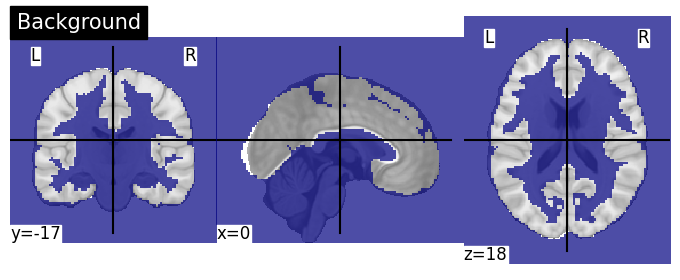

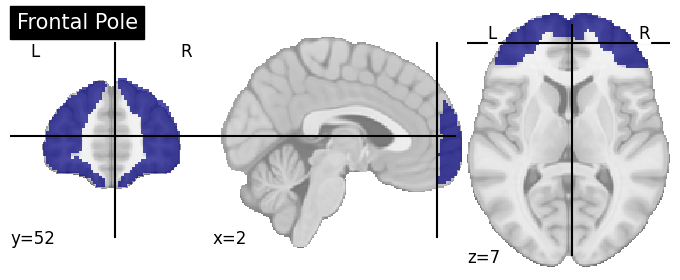

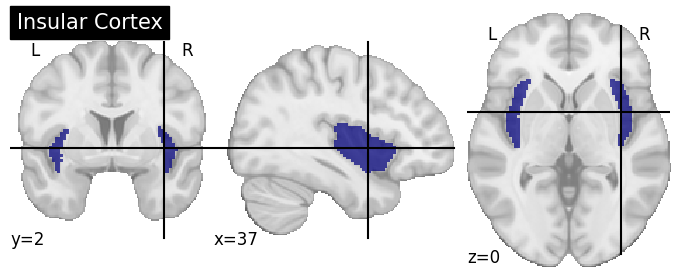

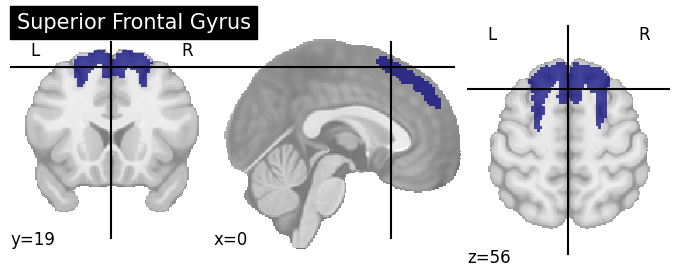

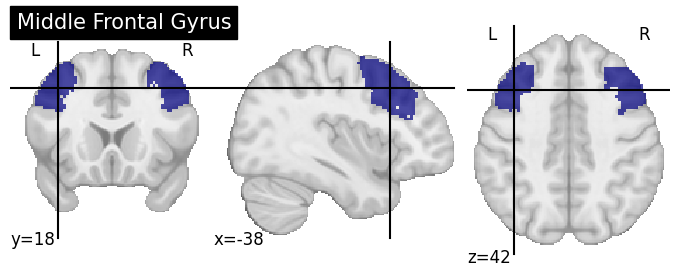

...

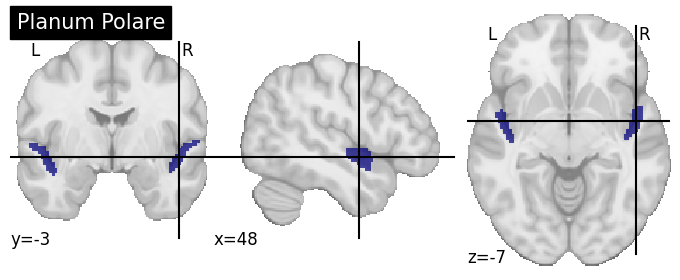

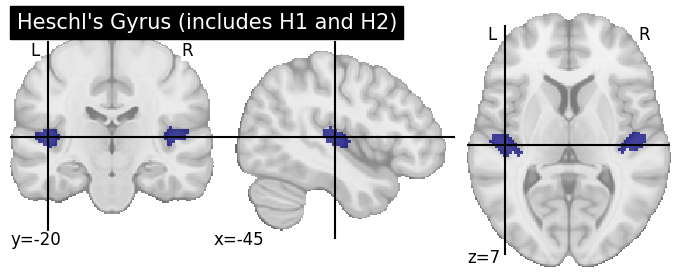

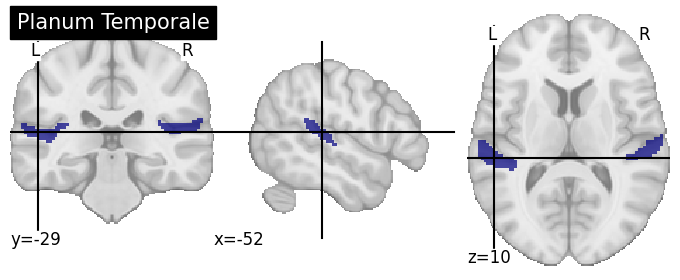

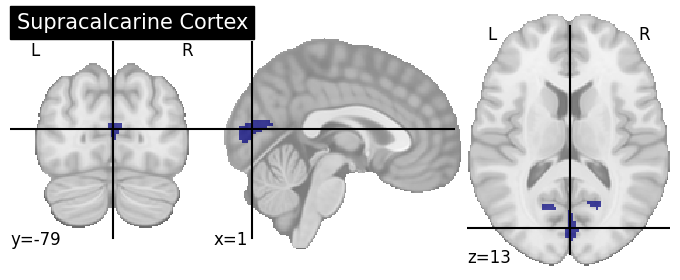

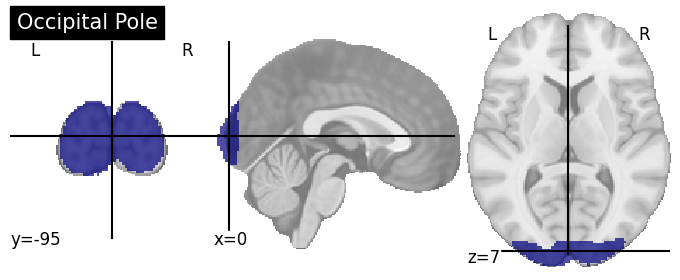

In [110]:
for idx in range (0,len(atlas.labels)):
    extract_V3A(image, idx)

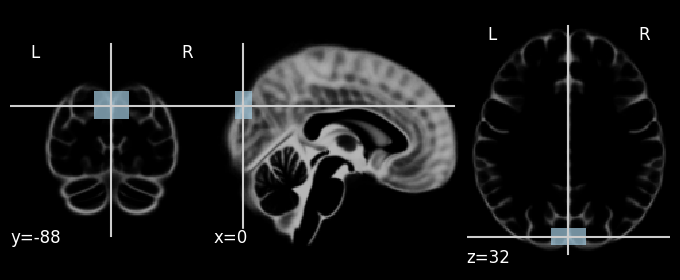

In [194]:
roi_data = np.zeros(img.shape[:3], dtype=int)
roi_data[85:111, 40:53, 95:115] = 1

# Create a new nibabel Nifti1Image for the ROI
roi_img = nib.Nifti1Image(roi_data, img.affine, img.header)

# Plot the ROI on top of the MRI image
plotting.plot_roi(roi_img, bg_img=img, cmap='Paired')

## Stable-Diffusion Functions

In [5]:
#Load stable diffusion. Config contains the model's setting, ckpt the model

def load_model_from_config(config, ckpt, device, verbose=False):
    print(f"Loading model from {ckpt}")

    pl_sd = torch.load(ckpt, map_location=device)
    if "global_step" in pl_sd:
        print(f"Global Step: {pl_sd['global_step']}")
    sd = pl_sd["state_dict"]
    model = instantiate_from_config(config.model)
    m, u = model.load_state_dict(sd, strict=False)
    if len(m) > 0 and verbose:
        print("missing keys:")
        print(m)
    if len(u) > 0 and verbose:
        print("unexpected keys:")
        print(u)

    model.to(device)
    model.eval()
    return model

In [6]:
# In my use case, just converts the image to tensor
def load_im(im_path):
    if im_path.startswith("http"):
        response = requests.get(im_path)
        response.raise_for_status()
        im = Image.open(BytesIO(response.content))
    else:
        im = Image.open(im_path).convert("RGB")
    tforms = transforms.Compose([
        # transforms.Resize(224),
        # transforms.CenterCrop((224, 224)),
        transforms.ToTensor(),
    ])
    inp = tforms(im).unsqueeze(0)
    return inp*2-1


# In my use case, normalizes the image
def prep_im(img):
    
    '''tforms = transforms.Compose([
        # transforms.Resize(224),
        # transforms.CenterCrop((224, 224)),
        transforms.ToTensor(),
    ])
    inp = tforms(img).unsqueeze(0)'''
    return img*2-1

In [7]:
# This functions implements true img2img in stable diffusion, by feeding clip image latents to a ddim diffuser 

@torch.no_grad()
def sample_model(input_im, model, sampler, precision, h, w, ddim_steps, n_samples, scale, ddim_eta):
    precision_scope = autocast if precision=="autocast" else nullcontext
    with precision_scope("cuda"):
        with model.ema_scope():
            c = model.get_learned_conditioning(input_im).tile(n_samples,1,1)

            if scale != 1.0:
                uc = torch.zeros_like(c)
            else:
                uc = None

            shape = [4, h // 8, w // 8]
            samples_ddim, _ = sampler.sample(S=ddim_steps,
                                             conditioning=c,
                                             batch_size=n_samples,
                                             shape=shape,
                                             verbose=False,
                                             unconditional_guidance_scale=scale,
                                             unconditional_conditioning=uc,
                                             eta=ddim_eta,
                                             x_T=None)

            x_samples_ddim = model.decode_first_stage(samples_ddim)
            return torch.clamp((x_samples_ddim + 1.0) / 2.0, min=0.0, max=1.0)

In [8]:
# modified version of the above class, so that it takes directly the latents as input, and not the image.
@torch.no_grad()
def sample_model_from_embedding(c, model, sampler, precision, h, w, ddim_steps, n_samples, scale, ddim_eta):
    
    precision_scope = autocast if precision=="autocast" else nullcontext
    with precision_scope("cuda"):
        with model.ema_scope():
            
            c = c.tile(n_samples,1,1)
            print("MY c SHAPE: ", c.shape)
            
            if scale != 1.0:
                uc = torch.zeros_like(c)
            else:
                uc = None

            shape = [4, h // 8, w // 8]
            samples_ddim, _ = sampler.sample(S=ddim_steps,
                                             conditioning=c,
                                             batch_size=n_samples,
                                             shape=shape,
                                             verbose=False,
                                             unconditional_guidance_scale=scale,
                                             unconditional_conditioning=uc,
                                             eta=ddim_eta,
                                             x_T=None)

            x_samples_ddim = model.decode_first_stage(samples_ddim)
            return torch.clamp((x_samples_ddim + 1.0) / 2.0, min=0.0, max=1.0)

In [9]:
# Loading stable diffusion. In this version unet and clip are wrapped in the same model instance.

# N.B. this model has been additionally trained compared to vanilla stable diffusion, in order to perform true img2img with only an image as input. 

# Problem: Requires 30GB GPU 

device_idx=0
device = f"cuda:{device_idx}"
ckpt="/workspace/datasets/Models/sd-clip-vit-l14-img-embed_ema_only.ckpt"
ckpt = os.path.join(sd_root, ckpt)
config="configs/stable-diffusion/sd-image-condition-finetune.yaml"

config = OmegaConf.load(os.path.join(sd_root, config))

model = load_model_from_config(config, ckpt, device=device).to('cuda')

Loading model from /workspace/datasets/Models/sd-clip-vit-l14-img-embed_ema_only.ckpt
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
Keeping EMAs of 688.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


In [11]:
if torch.cuda.is_available():
    device = torch.device("cuda")
    print(f"Found {torch.cuda.device_count()} available GPU(s)")
    for i in range(torch.cuda.device_count()):
        print(f"GPU {i}: {torch.cuda.get_device_name(i)}")
else:
    print("No GPU available")

Found 1 available GPU(s)
GPU 0: NVIDIA RTX A6000


## Loading the DataSet

In [12]:
# The dataloaders will output a tuple image/clip_encoding
root_dir = r"D:\Datasets\HYPER_face_fmri\sub-01\func"
class ImportImagenet(Dataset):
    def __init__ (self, root_dir, model):
        self.root_dir = root_dir
        self.device = device
        downed_image= None
    
        self.csv = pd.read_csv(os.path.join(self.root_dir,fileid), delimiter= ',')       
        
        self.targets = torch.cuda.IntTensor(self.csv["Target"]).long()
        
    def __len__(self):
        return len(self.csv)

    def __getitem__(self,index):

        CLIP = True
        
        img_path = os.path.join(self.root_dir, self.csv.iloc[index,0]).replace("\\","/")
        image = io.imread(img_path)
        image = T.ToTensor()(image).to('cuda')
        image = T.CenterCrop((200, 200))(image)
        image = prep_im(image)
        
        #This is used when NOT preprocessing images for CLIP
        if(not CLIP):

            return(image.to(device)) 

        else:

            with torch.no_grad():

                image_token = model.get_learned_conditioning(image.unsqueeze(0)).squeeze()
                # image_token = image_token.squeeze(1)    

            return(image.to(device), image_token.to(device))

In [13]:
# torch.cuda.empty_cache()

#### Splitting the DataSet

In [14]:
# In this case, I am not directly using train val and test set, but I am splitting the train set into train val and test.

In [15]:
batch = 1
subset = False
subset_cut = 10
shuffle = True


data_set = ImportImagenet(root_dir, 'Train', model)
dataset_len= len(data_set)

if (subset == True):

   
    # Subset dataset
    data_set = torch.utils.data.Subset(data_set, np.arange(0,len(data_set),subset_cut))
    
    dataset_len = len(data_set)
    
    val_split = int(0.1 * dataset_len)
    test_split = int(0.1 * dataset_len)
    train_split = dataset_len - val_split - test_split

else:
    
    val_split = int(0.1 * dataset_len)
    test_split = int(0.1 * dataset_len)
    train_split = dataset_len - val_split - test_split


print(test_split, train_split)
train_set, val_set, test_set = torch.utils.data.random_split(data_set, [train_split, val_split, test_split])

train_loader = torch.utils.data.DataLoader(train_set, batch_size=batch , shuffle = shuffle)
val_loader = torch.utils.data.DataLoader(val_set, batch_size=batch , shuffle = shuffle)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=batch , shuffle = shuffle)

4998 39992


In [16]:
print("torch.cuda.memory_allocated: %fGB"%(torch.cuda.memory_allocated(0)/1024/1024/1024))
print("torch.cuda.memory_reserved: %fGB"%(torch.cuda.memory_reserved(0)/1024/1024/1024))
print("torch.cuda.max_memory_reserved: %fGB"%(torch.cuda.max_memory_reserved(0)/1024/1024/1024))

torch.cuda.memory_allocated: 8.030346GB
torch.cuda.memory_reserved: 12.578125GB
torch.cuda.max_memory_reserved: 12.578125GB


## Simulating the electrodes

In [17]:
# Define the model for a single electrode (linear regression)

class myLinearRegression(nn.Module):
    def __init__(self, input_size, output_size):
        super().__init__()
        self.linear = nn.Linear(input_size, output_size)
        
    def forward(self, x):
        return self.linear(x)

In [18]:
# Creating 124 electrodes

num_electrodes = 124
input_size = 120000 # Flattened image size
output_size = 1
electrodes = nn.ModuleList([myLinearRegression(input_size, output_size).to(device) for _ in range(num_electrodes)])

# Pass the image through each electrode and collect the outputs

def readBrain(images, electrodes = electrodes):

    with torch.no_grad():
        brain_data = []
        for image in images: 
            electrode_data = []
            for electrode in electrodes:
                
                electrode_data.append(electrode(image.flatten()))

            # Concatenate the outputs into a single tensor
            electrodes_data = torch.cat(electrode_data, dim=0)

            brain_data.append(electrodes_data)
          

        brain_data = torch.stack(brain_data, dim=0)

        n_brain_data = brain_data + (0.3)*torch.randn(brain_data.shape).to(device)
    
        return n_brain_data

In [19]:
# Same as the function above, to be used for unbatched input

def readBrain_nobatch(image, electrodes = electrodes):

    with torch.no_grad():
        brain_data = []
        
        electrode_data = []
        for electrode in electrodes:
      
            electrode_data.append(electrode(image.flatten()))

        # Concatenate the outputs into a single tensor
        electrodes_data = torch.cat(electrode_data, dim=0)

        brain_data.append(electrodes_data)
          

        brain_data = torch.stack(brain_data, dim=0)

        n_brain_data = brain_data + (0.3)*torch.randn(brain_data.shape).to(device)
    
        return n_brain_data

## Reconstructing Latents from simulated electrodes

LinearRegression().fit(training_responses, training_latents)predicted_latents = reg.predict(test_responses)
Now, 
compare predicted_latents with test_latents using mean squared error.Feed predicted_latents to generative model -> 
predicted images.Feed test_latents to generative model -> target images.Compare the images.

In [20]:
train_brain_data = np.load("/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/saved_checkpoints/concatenated_brain_data.npy")
train_brain_labels = np.load("/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/saved_checkpoints/concatenated_cliplabel_data.npy")

In [21]:
linear = Ridge(alpha = 0.1)

In [22]:


linear_regression = linear.fit(train_brain_data, train_brain_labels)



## Decoding from latents

In [66]:
#CHANGE ATTEMPT NUMBER!


def makeImages(iterations):
    
    outpath="im_variations"
    scale=1.0
    h=512
    w=512
    n_samples=1
    
    precision="fp32"
    plms=False
    ddim_steps = 250
    ddim_eta=0.0
    device_idx=0
    save=True
    eval=False
    
    
    
    path = "/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs"
    folder_names = [int(name) for name in os.listdir(path) if name.isdigit()]
    last_attempt = max(folder_names)
    

    sample_path = fr"/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/{last_attempt + 1}"
    
    

    os.makedirs(sample_path)

    if plms:
        sampler = PLMSSampler(model)
        ddim_eta = 0.0
    else:
        sampler = DDIMSampler(model)



    for i in range(iterations):
        
        batch = next(iter(test_loader))
        
        for img in batch:
            
            img, source_token = batch
            
            print("img", img.shape)
            brain_data = readBrain(img)
            reconstructed_token = linear_regression.predict(brain_data.to('cpu'))
            reconstructed_token = torch.from_numpy(reconstructed_token).to('cuda').unsqueeze(0)
            
            print("recon", reconstructed_token.shape)
            
            torch.cuda.empty_cache()
            source_img = sample_model_from_embedding(source_token, model, sampler, precision, h, w, ddim_steps, n_samples, scale, ddim_eta)
            torch.cuda.empty_cache()
            rec_img = sample_model_from_embedding(reconstructed_token, model, sampler, precision, h, w, ddim_steps, n_samples, scale, ddim_eta)
            torch.cuda.empty_cache()

            source_img_rec = 255. * rearrange(source_img.squeeze().cpu().numpy(), 'c h w -> h w c')
            rec_img = 255. * rearrange(rec_img.squeeze().cpu().numpy(), 'c h w -> h w c')
            

            filename_o = os.path.join(sample_path, f"origin_{i}.jpg")
            filename_s = os.path.join(sample_path, f"source_{i}.jpg")
            filename_r = os.path.join(sample_path, f"reconstructed_{i}.jpg")
            print(filename_r)
            img = T.ToPILImage()(img.squeeze())
            img.save(filename_o)
            Image.fromarray(source_img_rec.astype(np.uint8)).save(filename_s)
            Image.fromarray(rec_img.astype(np.uint8)).save(filename_r)
            
        


In [69]:
# Generated images = iterations * batch_size (*2)

iterations = 10

makeImages(iterations)

img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.83it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.73it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_0.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.66it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.56it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_0.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.55it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_1.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.50it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.51it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_1.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.51it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_2.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.51it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_2.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.51it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_3.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.51it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_3.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.50it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.51it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_4.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.50it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_4.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.47it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.51it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_5.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.53it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_5.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.53it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_6.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.54it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.53it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_6.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.50it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_7.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.51it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.51it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_7.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_8.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.53it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_8.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.54it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_9.jpg
img torch.Size([1, 3, 200, 200])
recon torch.Size([1, 1, 768])
MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.50it/s]


MY c SHAPE:  torch.Size([1, 1, 768])
Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 249 timesteps


DDIM Sampler: 100%|██████████| 249/249 [00:19<00:00, 12.52it/s]


/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/11/reconstructed_9.jpg


## Image Visualizetion

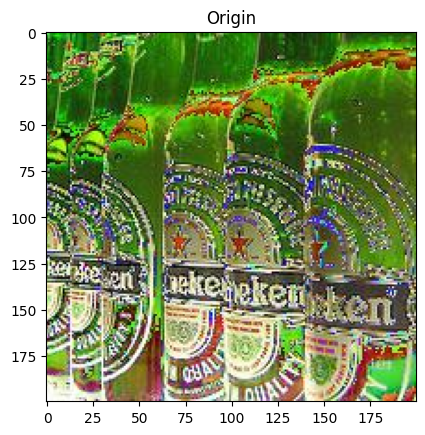

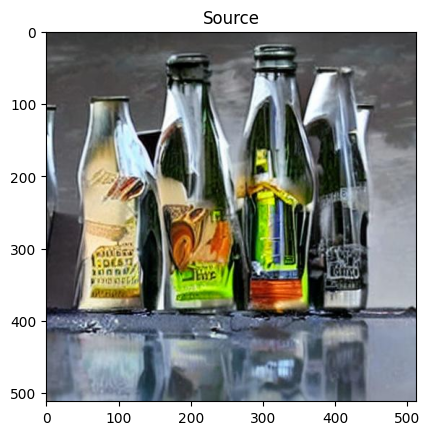

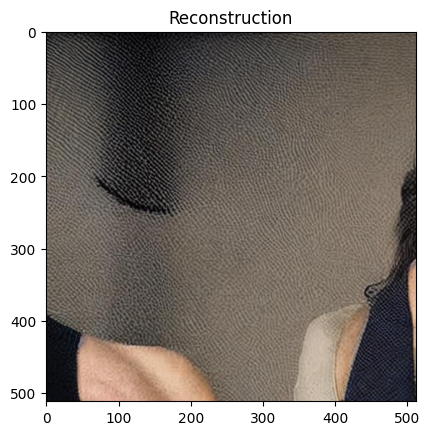

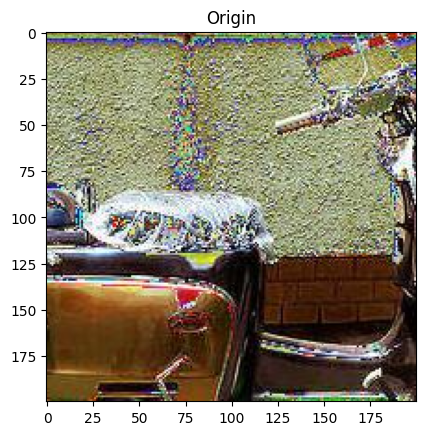

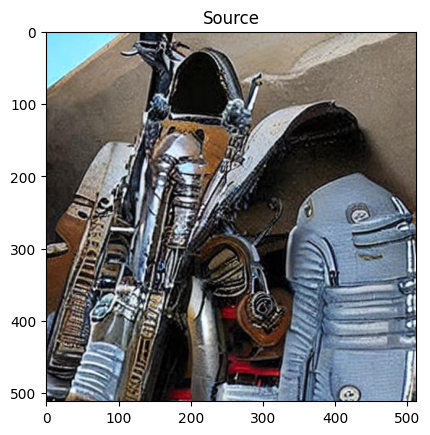

...

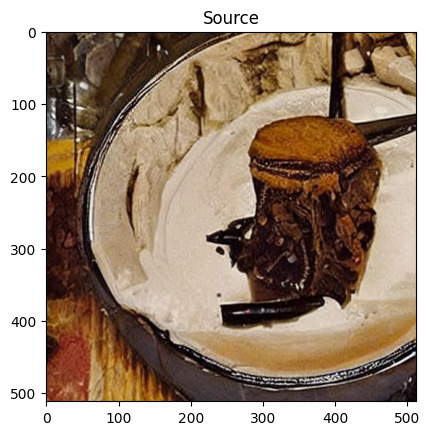

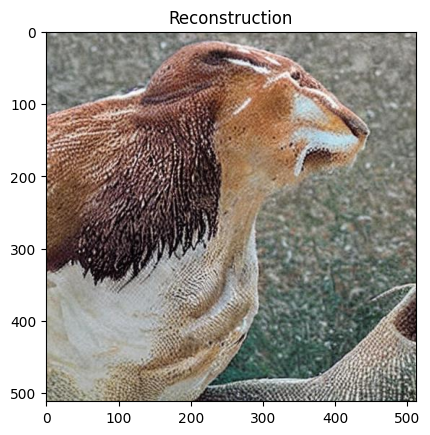

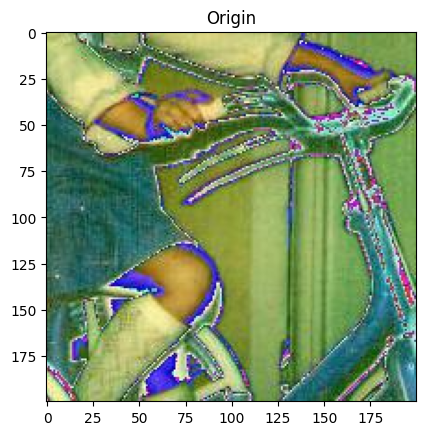

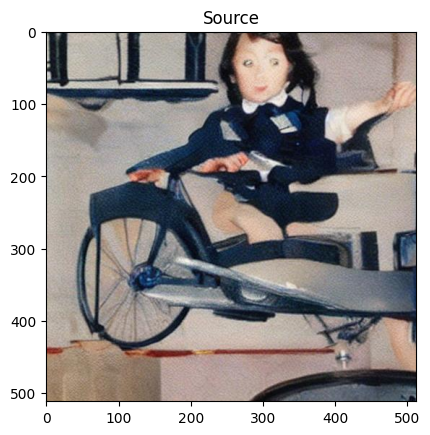

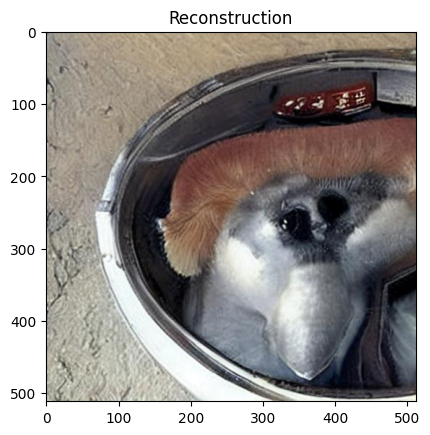

In [70]:
f = 11
for i in range(0,6):
    o = plt.imread(fr"/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/{f}/origin_{i}.jpg")
    s = plt.imread(fr"/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/{f}/source_{i}.jpg")
    r = plt.imread(fr"/workspace/Brain2Clip_Diffusion_GPU/scripts/Brain2Image/outputs/{f}/reconstructed_{i}.jpg")
    plt.imshow(o)
    plt.title("Origin")
    plt.show()
    plt.imshow(s)
    plt.title("Source")
    plt.show()
    plt.imshow(r)
    plt.title("Reconstruction")
    plt.show()

